# Diffusion Models and OT

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/gpeyre/ot4ml/blob/main/python/6-diffusion.ipynb)


We compare two transport methods from a mixture of Gaussians (or Dirac masses) to an isotropic Gaussian:

- **Diffusion models** integrate the score (log-density gradient), resulting in smooth, curved trajectories.
- **Optimal transport (OT)** moves particles along straight lines that minimize transport cost.

We visualize and compare the resulting mappings to highlight their different behaviors.

In [2]:
using Pkg
Pkg.add(["Distances", "ColorSchemes", "DifferentiationInterface", "ForwardDiff"])

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed DifferentiationInterface ─ v0.7.2
   Installed Distances ──────────────── v0.10.12
    Updating `~/.julia/environments/v1.10/Project.toml`
  [35d6a980] + ColorSchemes v3.30.0
  [a0c0ee7d] + DifferentiationInterface v0.7.2
  [b4f34e82] + Distances v0.10.12
  [f6369f11] + ForwardDiff v1.0.1
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [a0c0ee7d] + DifferentiationInterface v0.7.2
  [b4f34e82] + Distances v0.10.12
Precompiling packages...
   4995.0 ms  ✓ DifferentiationInterface
   4508.6 ms  ✓ Distances
   5347.0 ms  ✓ DifferentiationInterface → DifferentiationInterfaceGPUArraysCoreExt
   5923.1 ms  ✓ DifferentiationInterface → DifferentiationInterfaceChainRulesCoreExt
   7006.2 ms  ✓ DifferentiationInterface → DifferentiationInterfaceStaticArraysExt
   3854.3 ms  ✓ DifferentiationInterface → DifferentiationInterfaceSparseArraysExt
   3005.0 ms  ✓ Distances → DistancesSp

In [3]:
using LinearAlgebra
using Statistics
using Distances

using ColorSchemes
using Plots

using DifferentiationInterface
import ForwardDiff

const ADbackend = AutoForwardDiff()

AutoForwardDiff()

We define a **mixture of Gaussians** in 2D by specifying:

- `mu`: the coordinates of the Gaussian means (shape `2 × K`),
- `K`: the number of components,
- `sigma`: the standard deviation (initialized here to zero for each component),
- `a`: uniform weights for each component (summing to 1).

In [4]:
mu = randn(2, 5) * 8
mu = [-1 -1; 1.3 -.7; 0 1.2]' .* 4
# mu = rand(2, 2) .* 4

K = size(mu, 2)
sigma = zeros(K)
a = ones(K) / K
;

We define a time-dependent density $\rho(x, t)$ as a **mixture of Gaussians** with:

- Means scaled as $\mu_i(t) = \mu_i \cdot e^{-t}$
- Time-evolving variances:
  $$
  \sigma_i(t)^2 = e^{-2t} \sigma_i^2 + (1 - e^{-2t})
  $$

The **score function** is computed as:
$$
\eta(x, t) = \nabla_x \log \rho(x, t),
$$
which is implemented using automatic differentiation:
- Compute $\rho(x, t)$
- Differentiate its log-density w.r.t. $x$

In [5]:
function gauss(x, m, s)
    return 1 ./ (2 * pi * s.^2) .* exp.( -sum((m .- x).^2, dims=1) ./ (2 * s.^2) )
end

function gaus_mixture(x, mu, sigma, a)
    y = vcat([a[i] .* gauss(x, mu[:, i], sigma[i]) for i in eachindex(a)]...)
    return sum(y, dims=1)
end

function rho(x, t, mu, sigma, a)
    sigma_t = sqrt.(exp.(-2 * t) .* sigma.^2 .+ (1 .- exp.(-2 * t)))
    mu_t = mu .* exp(-t)
    return gaus_mixture(x, mu_t, sigma_t, a)
end
rho(x, t) = rho(x, t, mu, sigma, a)

function eta(x, t, mu, sigma, a)
    f = (x, t) -> sum(rho(x, t))
    grad_x = gradient(f, ADbackend, x, Constant(t))
    return grad_x ./ rho(x, t)
end
eta(x, t) = eta(x, t, mu, sigma, a);

We simulate a **backward diffusion process** defined by the stochastic differential equation:
$$
dY_t = Y_t + (1 + \alpha) \, \eta_t(Y_t) \, dt + \sqrt{2\alpha} \, dW_t,
$$
where $\eta_t(Y_t)$ is the score (gradient of log-density), and $W_t$ is standard Brownian motion.

By setting $\alpha = 0$, the evolution becomes **deterministic**, reducing to:
$$
dY_t = Y_t + \eta_t(Y_t) \, dt.
$$

In [6]:
# set alpha=0 to obtain deterministic paths
alpha = .03
alpha = 0 # pure advection

T = 20. # final time
N = 2500 # number of steps
tau = T / N # step size
P = 200 # particules

Y = zeros(2, P, N)
Y[:,:,1] .= randn(2,P)  # initial positions (Gaussian)
t = T

for i in 1:N-1
    brownian_part = sqrt(2*alpha) * randn(2, P)
    Y_t = @view Y[:,:,i]
    Y[:,:,i+1] = Y_t .+ tau * ( Y_t .+ (1+alpha) * eta(Y_t, t)) .+ brownian_part
    t -= tau
end

We display the particle **trajectories** over time, simulating the transport from the isotropic Gaussian to the initial distribution.

To illustrate the **induced mapping**, each final point is assigned to the nearest initial Dirac center (from `mu`), and its full trajectory is colored accordingly.

- Trajectories are shown with semi-transparent lines.
- Starting points are marked with colored dots.
- Dirac centers (`mu`) are displayed as large black dots.

This visualization reveals how the **Gaussian mass is partitioned** and directed toward different components of the original mixture.

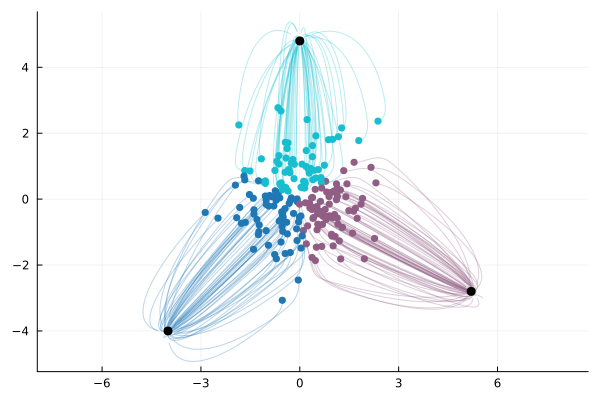

In [7]:
# Compute the nearest mu cluster for each trajectory
final_points = Y[:, :, end] # Shape: (2, P)
distances = pairwise(Euclidean(), final_points, mu) # Shape: (P, K)
cluster_indices = argmin(distances, dims=2) # Shape: (P,)

# Display trajectories clustered by color with semi-transparency and initial dots
colors = get(colorschemes[:tab10], range(0, 1, length=K)) # Use a colormap with K colors
plot(aspect_ratio=:equal)
for k in 1:P
    cluster_color = colors[cluster_indices[k][2]]
    plot!(Y[1, k, :], Y[2, k, :], linecolor=cluster_color, alpha=0.3, label="") # Semi-transparent line
    scatter!([Y[1, k, 1]], [Y[2, k, 1]], color=cluster_color, markersize=4, markerstrokewidth=0, label="") # Final point dot
end
scatter!(mu[1, :], mu[2, :], color=:black, markersize=5, label="")  # Plot the mu points

We compute the **optimal transport plan** using the [POT](https://pythonot.github.io/) library by solving the **Kantorovich problem** between:

- Source points `xi` (initial Gaussian samples),
- Target points `mu` (Dirac locations),
- With uniform weights for both distributions.

The cost matrix is the **squared Euclidean distance**.

We visualize the resulting transport plan by drawing **segments** between matched source and target points, with:
- Color indicating the target Dirac each source point is mostly mapped to,
- Transparency reflecting transport strength,
- Target locations (`mu`) shown as black dots.

This illustrates how the **optimal plan partitions and moves mass** from the source to the target.

In [8]:
Pkg.add("Tulip")
Pkg.add(url="https://github.com/JuliaOptimalTransport/OptimalTransport.jl/", rev="update_compat")
using OptimalTransport
using Tulip

   Resolving package versions...
   Installed CodecBzip2 ───────── v0.8.5
   Installed TimerOutputs ─────── v0.5.29
   Installed MutableArithmetics ─ v1.6.4
   Installed StructTypes ──────── v1.11.0
   Installed LinearOperators ──── v2.10.0
   Installed BenchmarkTools ───── v1.6.0
   Installed QPSReader ────────── v0.2.1
   Installed MathOptInterface ─── v1.42.0
   Installed AMD ──────────────── v0.5.3
   Installed JSON3 ────────────── v1.14.3
   Installed Tulip ────────────── v0.9.7
   Installed Krylov ───────────── v0.9.10
   Installed LDLFactorizations ── v0.10.1
    Updating `~/.julia/environments/v1.10/Project.toml`
  [6dd1b50a] + Tulip v0.9.7
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [14f7f29c] + AMD v0.5.3
  [6e4b80f9] + BenchmarkTools v1.6.0
  [523fee87] + CodecBzip2 v0.8.5
  [0f8b85d8] + JSON3 v1.14.3
⌅ [ba0b0d4f] + Krylov v0.9.10
  [40e66cde] + LDLFactorizations v0.10.1
  [5c8ed15e] + LinearOperators v2.10.0
  [b8f27783] + MathOptInterface v1.42.0
  [d8a4904e

In [15]:
#ENV["PYTHON"] = ""
#Pkg.add(["PythonOT"])
#Pkg.build("PyCall")
#using PythonOT

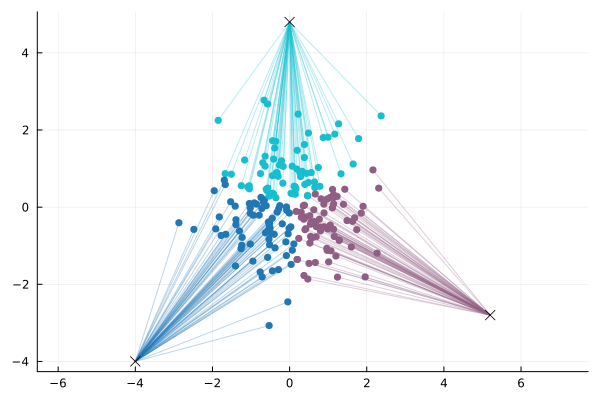

In [14]:
xi = Y[:, :, 1]'
yj = mu'
n = size(xi, 1)
m = size(yj, 1)

cost_matrix = pairwise(Euclidean(), xi', yj')
a = ones(n) / n  # Source weights
b = ones(m) / m  # Target weights

# Solves the Kantorovich problem
P = emd(a, b, cost_matrix, Tulip.Optimizer())   # using OptimalTransport.jl
#P = PythonOT.emd(a, b, cost_matrix)             # using PythonOT


# Draw transport segments based on P_ij
plot(aspect_ratio=:equal, legend=false)
for i in 1:n
    for j in 1:m
        if P[i, j] > 1e-3 # Only draw segments with significant transport
            plot!([xi[i, 1], yj[j, 1]], [xi[i, 2], yj[j, 2]], linecolor=colors[j], alpha=0.3)
            scatter!([xi[i, 1]], [xi[i, 2]], color=colors[j], markersize=4, markerstrokewidth=0)  # Final point dot
        end
    end
end
scatter!(mu[1, :], mu[2, :], color=:black, markersize=5, shape=:xcross) # Plot the mu points